# Outer solar system

*Name: Elvina Fahlgren*

The course project for Scientific Visualization was about simulate and vizualize the outher solar system using Python and Blender. This Notebook consists of my solutions for the vizualization.

### Setting up the scene and simulation
To create the scene with the six planets I did a for-loop through the given list of names of the planets. I created a sphere corresponing to each planet with its right position from the given array. Here, I choosed to give every planet the same radius. 

To simulate the planets orbits, I created a for-loop which inserted a keyframe to every planet every 100th frame. See code below.

In [ ]:
import numpy as np
import bpy
from math import *
from mathutils import *
# Gravitational constant when the mass of the sun is 1.
G = 2.95912208286e-4
# Planet names and order
planets = ('Sun','Jupiter','Saturn','Uranus','Neptune','Pluto')
# The data below is obtained from here: https://ssd.jpl.nasa.gov/horizons.cgi
# Masses relative to the sun (the increased sun mass is to account for the inner planets)
masses = np.array([1.00000597682, 
                   0.000954786104043, 
                   0.000285583733151, 
                   0.0000437273164546, 
                   0.0000517759138449, 
                   6.571141277023631e-09])
# Positions of the planets in astronomical units (au) on September 5, 1994, at 0h00 GST.
positions = np.array([[0., 0., 0.],
                    [-3.502576677887171E+00, -4.111754751605156E+00, 9.546986420486078E-02],
                    [9.075323064717326E+00, -3.443060859273154E+00, -3.008002285860299E-01],
                    [8.309900066449559E+00, -1.782348877489204E+01, -1.738826162402036E-01],
                    [1.147049510166812E+01, -2.790203169301273E+01,  3.102324955757055E-01],
                    [-1.553841709421204E+01, -2.440295115792555E+01,  7.105854443660053E+00]])
# Velocities of the planets relative to the sun in au/day on September 5, 1994, at 0h00 GST.
velocities = np.array([[0., 0., 0.],
                    [5.647185685991568E-03, -4.540768024044625E-03, -1.077097723549840E-04],
                    [1.677252496875353E-03,  5.205044578906008E-03, -1.577215019146763E-04],
                    [3.535508197097127E-03,  1.479452678720917E-03, -4.019422185567764E-05],
                    [2.882592399188369E-03,  1.211095412047072E-03, -9.118527716949448E-05],
                    [2.754640676017983E-03, -2.105690992946069E-03, -5.607958889969929E-04]])
# Compute total linear momentum
ptot = (masses[:,np.newaxis]*velocities).sum(axis=0)
# Recompute velocities relative to the center of mass
velocities -= ptot/masses.sum()
# Linear momenta of the planets: p = m*v
momenta = masses[:,np.newaxis]*velocities
# Function for Newtonian acceleration field
def acc(x, masses = masses, G = G):
    N = masses.shape[0]
    d = x.shape[-1]
    dx_pairs = x[:, np.newaxis] - x[np.newaxis, :]
    msq_pairs = masses[:, np.newaxis]*masses[np.newaxis, :]
    
    # Remove self-self interactions
    dx_pairs = np.delete(dx_pairs.reshape((N*N,d)),slice(None,None,N+1), axis = 0).reshape((N,N-1,d))
    msq_pairs = np.delete(msq_pairs.reshape((N*N)),slice(None,None,N+1), axis = 0).reshape((N,N-1))
    
    # Compute pairwise distances
    dist_pairs = np.sqrt((dx_pairs**2).sum(axis=-1))
    
    # Compute the gravitational force using Newton's law
    forces = -G*(dx_pairs*msq_pairs[:,:,np.newaxis]/dist_pairs[:,:,np.newaxis]**3).sum(axis=1)
    
    # Return accelerations
    return forces/masses[:,np.newaxis]
# Select time step and total integration time (measured in days)
h = 100 # Time stepsize in days
totaltime = 100*365 # Total simulation time in days
# Preallocate output vectors at each step
t_out = np.arange(0.,totaltime,h)
x_out = np.zeros(t_out.shape + positions.shape, dtype=float)
x_out[0,:,:] = positions
v_out = np.zeros_like(x_out)
v_out[0,:,:] = velocities
# Use Symplectic Euler method for integration
for x0, x1, v0, v1 in zip(x_out[:-1],x_out[1:],v_out[:-1],v_out[1:]):
    x1[:,:] = x0 + h*v0
    v1[:,:] = v0 + h*acc(x1)
# -------------------------
# Add the Blender code here
# -------------------------

objs = bpy.data.objects

if objs.get("Cube") is not None:
    objs.remove(objs["Cube"], do_unlink=True)

# run this to clear the planets  
def clear_objs():
     
    # add to candidate_list
    candidate_list = [item.name for item in objs if item.type == "MESH"]

    # select only the candidate_list
    for object_name in candidate_list:
        objs[object_name].select_set(True)

    # remove all selected
    bpy.ops.object.delete()

    # remove meshes
    for item in bpy.data.meshes:
        bpy.data.meshes.remove(item)
              
#clear_objs()

# create the planets
for i in range(len(planets)):
    if objs.get(planets[i]) is None:
        # Add a new sphere with right position and name it
        bpy.ops.mesh.primitive_uv_sphere_add(radius=1.3, location=positions[i], scale=(1, 1, 1))
        bpy.context.object.name = planets[i]
        
        # make mesh smooth
        bpy.ops.object.shade_smooth()
    

# set first and last frame index
fps = 24 # Frames per second (fps)
bpy.context.scene.frame_start = 0
bpy.context.scene.frame_end = 365

# loop through frames and insert keyframes every 100th frame
keyframe_freq = 100 
for n in range(totaltime):
    
    # Check if n is a multiple of keyframe_freq
    if n%keyframe_freq == 0:
        
        bpy.context.scene.frame_set(n/h)
        
        # Loop through all planets to set their new location and add keyframe
        for planet in planets:
            c = bpy.data.objects[planet]
            c.location.x = x_out[int(n/h), planets.index(planet), 0]
            c.location.y = x_out[int(n/h), planets.index(planet), 1]
            c.location.z = x_out[int(n/h), planets.index(planet), 2]
            
            c.keyframe_insert(data_path="location")

### Adding textures
I downloaded texture images from the given [website](http://planetpixelemporium.com/). And used those as images textures, as described in the project description. 

For the rings of Uranus and Saturn I used the texture images from the given website. To apply the images correctly, I followed [this](https://blender.stackexchange.com/questions/92812/how-can-i-assign-an-image-texture-gradient-along-a-circlular-ring) solution. And to make them transparent I changed the *Blend Mode* to *Alpha Blend* and adjusted the transparency with *Alpha*.

I also rotated Saturn and Uranus to give them a more realitic look. 

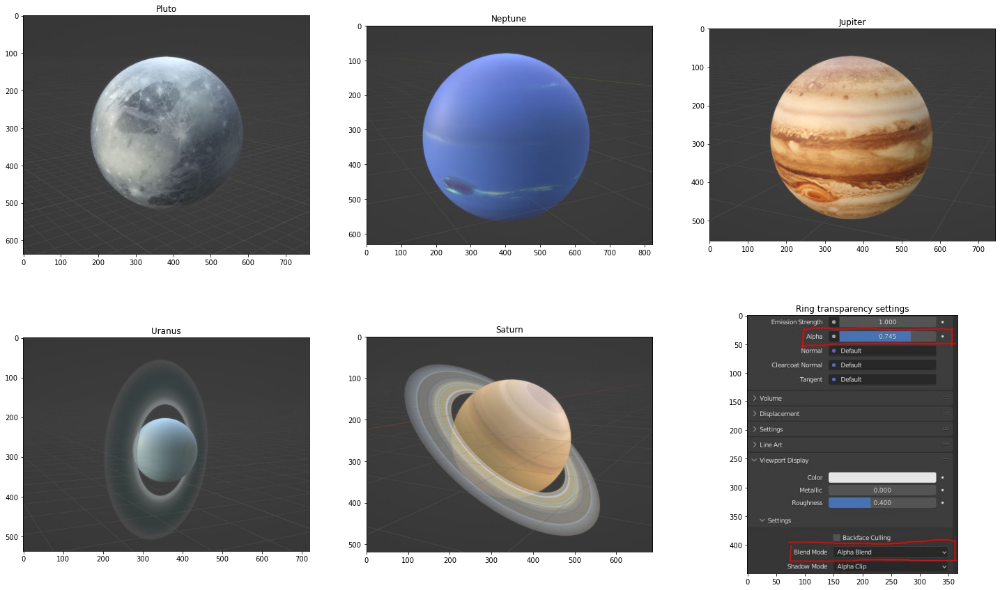

In [1]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
plt.figure(figsize=(25, 15))

plt.subplot(231)
plt.imshow(mpimg.imread('pluto.JPG'))
plt.title("Pluto")

plt.subplot(232)
plt.imshow(mpimg.imread('neptune.JPG'))
plt.title("Neptune")

plt.subplot(233)
plt.imshow(mpimg.imread('jupiter.JPG'))
plt.title("Jupiter")

plt.subplot(234)
plt.imshow(mpimg.imread('uranus.JPG'))
plt.title("Uranus")

plt.subplot(235)
plt.imshow(mpimg.imread('saturn.JPG'))
plt.title("Saturn")

plt.subplot(236)
plt.imshow(mpimg.imread('ring-transparency.JPG'))
plt.title("Ring transparency settings")

plt.show()

### Background
I created a background with stars using a *ColorRamp* and *Noise Texture*. I followed [this](https://blender.stackexchange.com/questions/44773/stars-background-in-cycles/44779) solution and tried out differnt values to get something that looked like space.

I also added some *Ambient Occlusion* to be able to see the planets clearly.

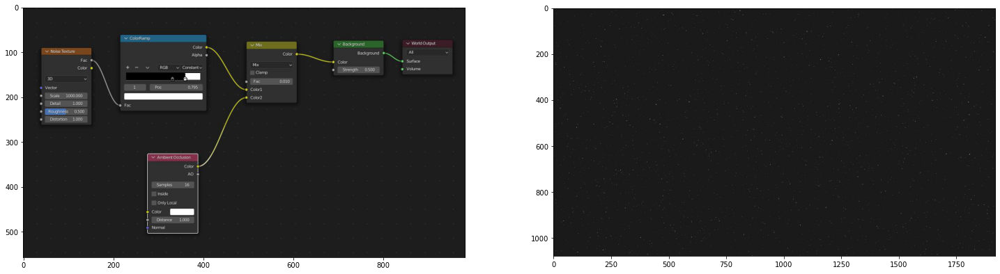

In [2]:
plt.figure(figsize=(25, 15))
img1 = mpimg.imread('world-background.JPG')
img2 = mpimg.imread('background-example.jpg')

plt.subplot(121)
plt.imshow(img1)

plt.subplot(122)
plt.imshow(img2)

plt.show()

### The sun
I spend most of my time creating the sun, but it ended up not being as good as I expected. I first tried making an emisson from the sun (as described in the project description), but I wanted the bloom effect and therefore swaped to render enginge *Eevee*. I made the bloom effect and it looked cool. I also tried putting a normal light inside the sun so it looked like even more light was coming from the sun not having to use a stronger emission on the sun. It looked cool, but after rendering photos and an animation, it did not look good because of the bad quality. So I ended up with the sun that I had in the begining. I increased the *Ambient Occlusion* for the background since I wanted my animation on the sun to be visible (with too high emission strength, the sun texture was not possible to see).

For the texture and texture animation on the sun I used [this](https://www.youtube.com/watch?v=amVoEm1GgOI&ab_channel=MicroSingularity) tutorial. For the animation, I inserted keyframes to the *W* value at *Musgrave Texture*. And here is my result of the sun:

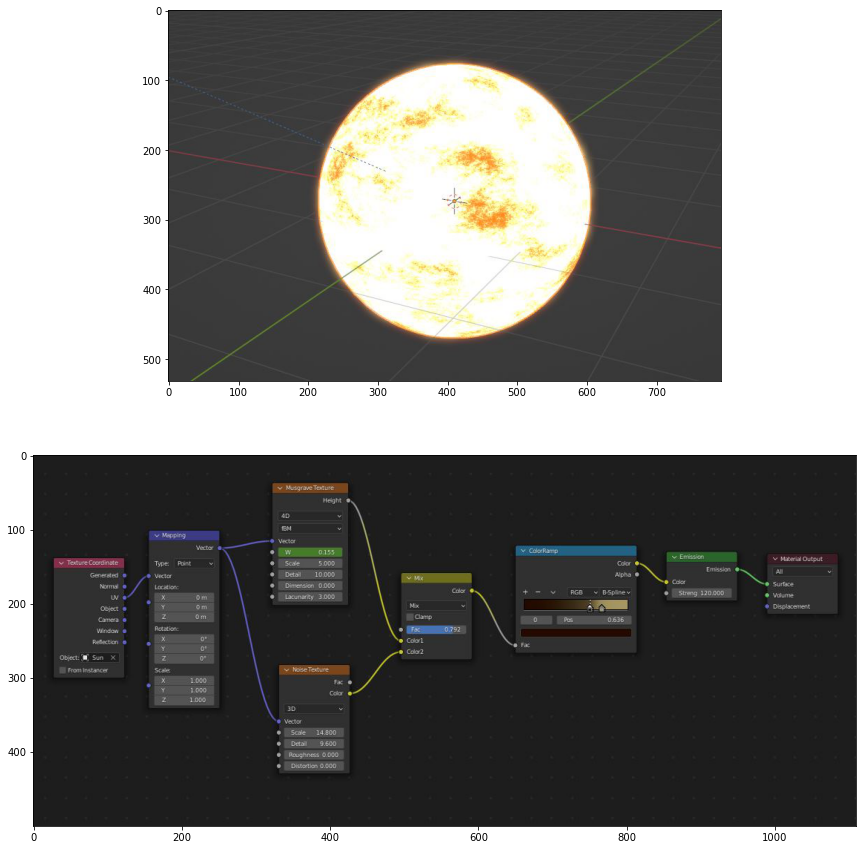

In [3]:
plt.figure(figsize=(25, 15))
sun = mpimg.imread('sun.JPG')
sunNodeView = mpimg.imread('sun-node.JPG')

plt.subplot(211)
plt.imshow(sun)

plt.subplot(212)
plt.imshow(sunNodeView)

plt.show()

### Camera animation
For the camera animation I followed [this]() guide, creating a path which an empty object is following and in turn, the camera has the empty object as its parent. In the middle of the animation, you can see that the camera moves slower, and that is because I inserted keyframes there. I thought it looked better. 

### Final result

In [4]:
from IPython.display import Video

Video("project.mp4", embed=True)